In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/vqa-dataset/vqa_dataset/data-00016-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00004-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/state.json
/kaggle/input/vqa-dataset/vqa_dataset/data-00011-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/dataset_info.json
/kaggle/input/vqa-dataset/vqa_dataset/data-00002-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00028-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00015-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00013-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00019-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00027-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00031-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00006-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00033-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00008-of-00034.arrow
/kaggle/input/vqa-dataset/vqa_dataset/data-00025-of-00034.arrow

In [2]:
from datasets import load_from_disk
dataset = load_from_disk("/kaggle/input/vqa-dataset/vqa_dataset")

Loading dataset from disk:   0%|          | 0/34 [00:00<?, ?it/s]

In [3]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, random_split,Dataset
from tqdm import tqdm
from transformers import BertModel, ViTModel, BertTokenizer

class VQADataset(Dataset):
    def __init__(self, dataset, tokenizer):
        self.dataset = dataset
        self.tokenizer = tokenizer

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image_path = item["image"]
        question = item["question"]
        label = item["multiple_choice_answer"]

        # Preprocess image
        image = preprocess_image(image_path)
        # Tokenize inputs
        inputs = self.tokenizer(question, return_tensors="pt", padding=True, truncation=True, max_length=64)
        input_ids = inputs["input_ids"].squeeze(0)

        # Create attention mask with the same shape as input_ids
        attention_mask = (input_ids != 0).long()
        return {"input_ids": input_ids, "attention_mask": attention_mask, "image": image, "label": label}

# Define a function to preprocess an image
def preprocess_image(image_path):
    image = image_path
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = transform(image)
    return image

def show_image(image):
    # Denormalize the image
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    # Convert tensor to numpy array
    image = image.cpu().numpy().transpose(1, 2, 0)
    
    # Denormalize
    image = std * image + mean
    image = np.clip(image, 0, 1)

    # Show the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Assuming dataset and VQADataset are already defined
test_dataset = dataset.select(range(9000,9050))
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Split the dataset into training, validation, and test s
test_vqa_dataset = VQADataset(test_dataset, tokenizer)

# Custom collate function
def custom_collate_fn(batch):
    max_seq_length = max(len(item["input_ids"]) for item in batch)
    
    padded_input_ids = []
    padded_attention_masks = []
    images = []
    labels = []
    
    for item in batch:
        input_ids = item["input_ids"]
        attention_mask = item["attention_mask"]
        image = item["image"]
        label = item["label"]
        
        # Pad input_ids and attention_mask
        padding_length = max_seq_length - len(input_ids)
        padded_input_ids.append(torch.cat([input_ids, torch.zeros(padding_length, dtype=torch.long)]))
        padded_attention_masks.append(torch.cat([attention_mask, torch.zeros(padding_length, dtype=torch.long)]))
        
        images.append(image)
        
        # Encode labels
        encoded_label = torch.tensor(tokenizer.convert_tokens_to_ids(label))
        labels.append(encoded_label)
    
    padded_input_ids = torch.stack(padded_input_ids)
    padded_attention_masks = torch.stack(padded_attention_masks)
    images = torch.stack(images)
    labels = torch.stack(labels)  # No need for this to be a list
    
    return {
        "input_ids": padded_input_ids,
        "attention_mask": padded_attention_masks,
        "image": images,
        "label": labels
    }

# Create DataLoader instances with custom collate functio
test_loader = DataLoader(test_vqa_dataset, batch_size=1, shuffle=False, collate_fn=custom_collate_fn)


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [4]:
!pip install peft
!pip install vit-pytorch

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 4.0 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 kB 1.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.7/119.7 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 1.9 MB/s eta 0:00:00


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

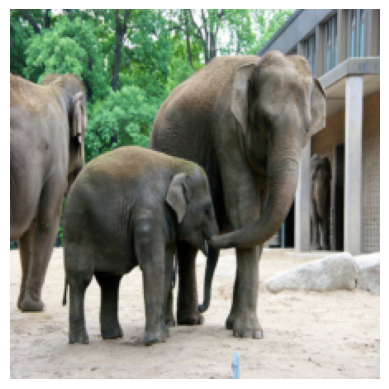

2024-05-18 15:47:39.760210: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-18 15:47:39.760366: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-18 15:47:39.918197: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Question: [CLS] how many legs does an elephant have? [SEP]
Prediction: 4
Ground Truth Label: 4


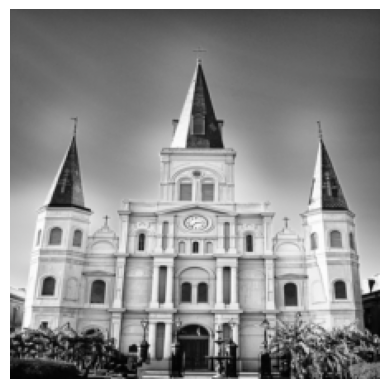

Question: [CLS] would a person seem small in this building? [SEP]
Prediction: no
Ground Truth Label: yes


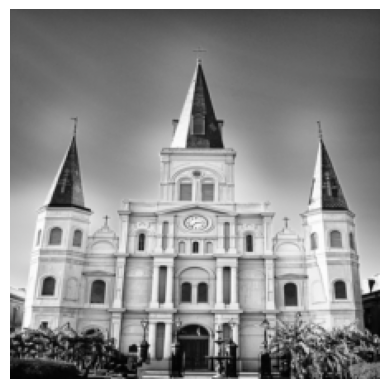

Question: [CLS] where is the clock? [SEP]
Prediction: [UNK]
Ground Truth Label: [UNK]


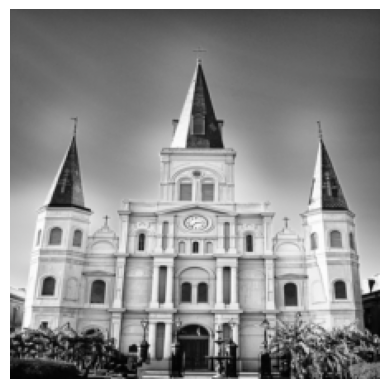

Question: [CLS] is this a modern home? [SEP]
Prediction: no
Ground Truth Label: no


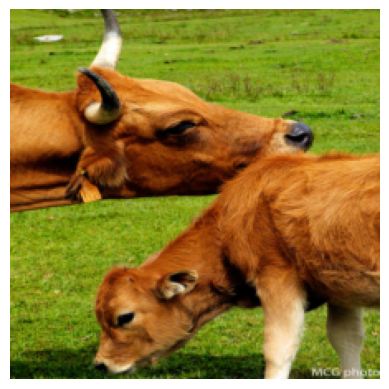

Question: [CLS] how many horns does the animal on the left have? [SEP]
Prediction: 2
Ground Truth Label: 2


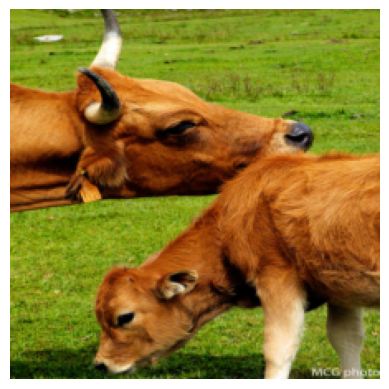

Question: [CLS] what kinds of animal is this? [SEP]
Prediction: cow
Ground Truth Label: cow


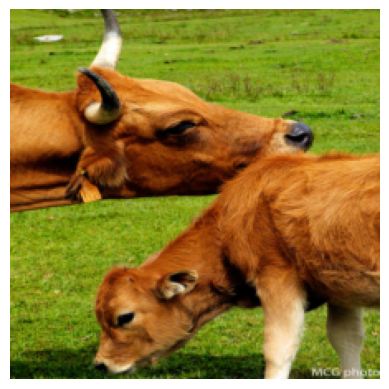

Question: [CLS] what is the relationship between the animals? [SEP]
Prediction: [UNK]
Ground Truth Label: [UNK]


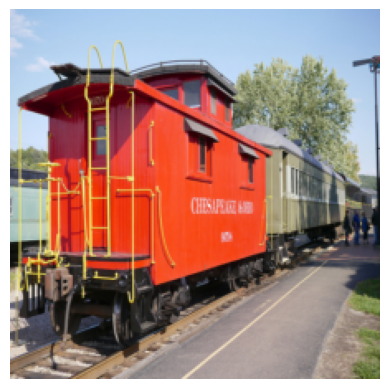

Question: [CLS] is this a passenger train? [SEP]
Prediction: yes
Ground Truth Label: yes


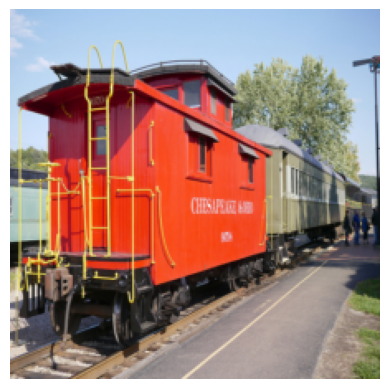

Question: [CLS] what train car is red? [SEP]
Prediction: yellow
Ground Truth Label: [UNK]


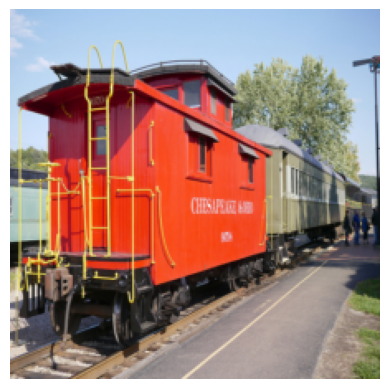

Question: [CLS] how many people are shown? [SEP]
Prediction: 4
Ground Truth Label: 4


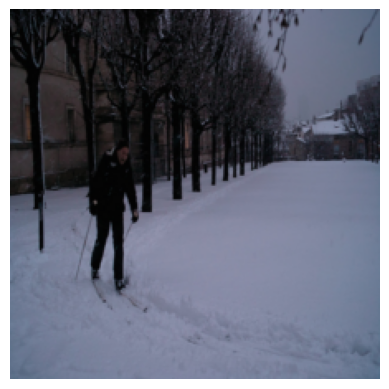

Question: [CLS] is he skiing? [SEP]
Prediction: yes
Ground Truth Label: yes


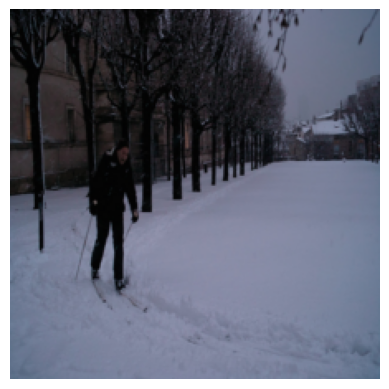

Question: [CLS] what type of trees are present in this picture? [SEP]
Prediction: oak
Ground Truth Label: oak


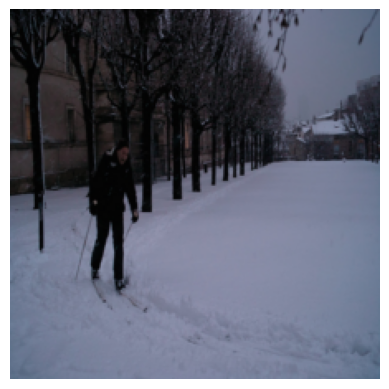

Question: [CLS] how many dogs are there? [SEP]
Prediction: 0
Ground Truth Label: 0


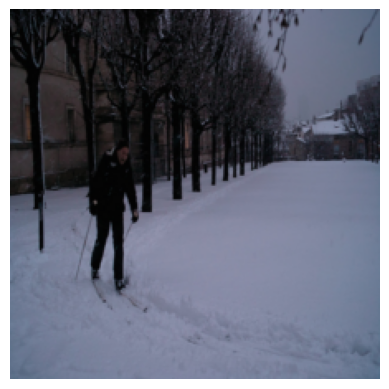

Question: [CLS] is this a steep slope? [SEP]
Prediction: yes
Ground Truth Label: no


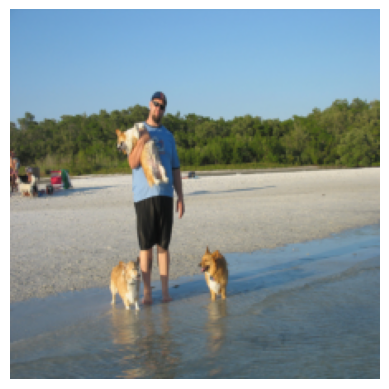

Question: [CLS] are the dogs wet? [SEP]
Prediction: yes
Ground Truth Label: yes


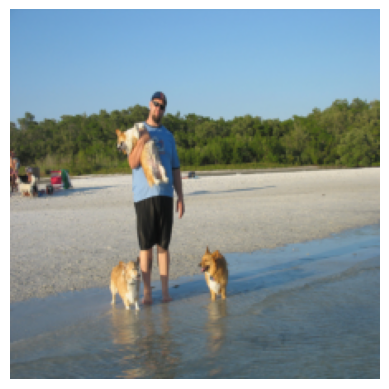

Question: [CLS] what dogs is this? [SEP]
Prediction: [UNK]
Ground Truth Label: [UNK]


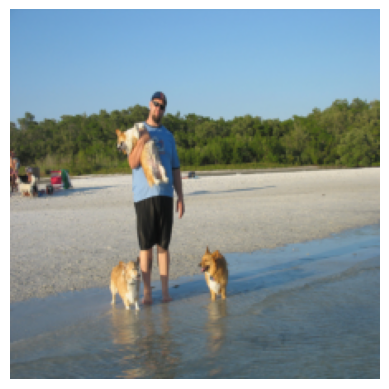

Question: [CLS] is the man holding a child? [SEP]
Prediction: no
Ground Truth Label: no


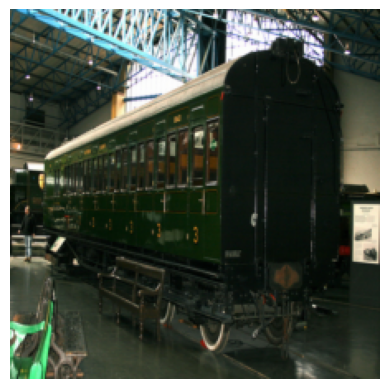

Question: [CLS] is this a trolley car? [SEP]
Prediction: yes
Ground Truth Label: yes


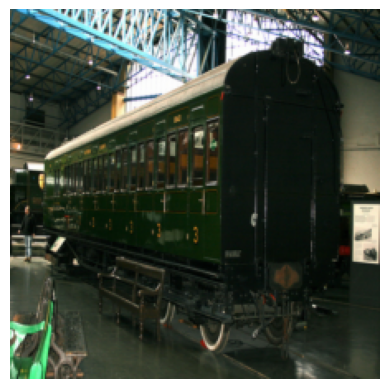

Question: [CLS] is this inside? [SEP]
Prediction: yes
Ground Truth Label: yes


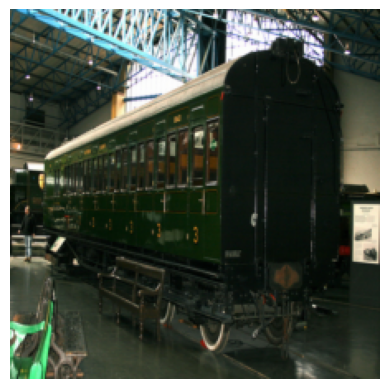

Question: [CLS] what color is the trolley? [SEP]
Prediction: red
Ground Truth Label: green


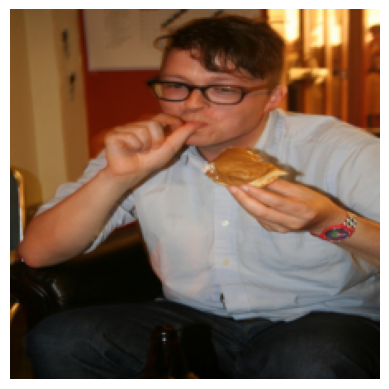

Question: [CLS] is this man's shirt clean? [SEP]
Prediction: no
Ground Truth Label: yes


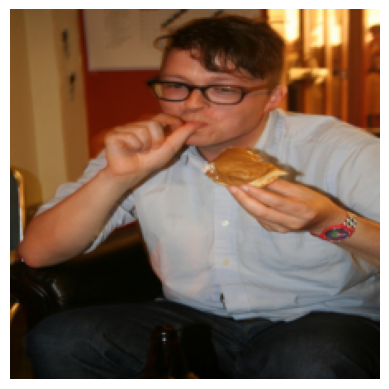

Question: [CLS] what does he have in his mouth? [SEP]
Prediction: food
Ground Truth Label: thumb


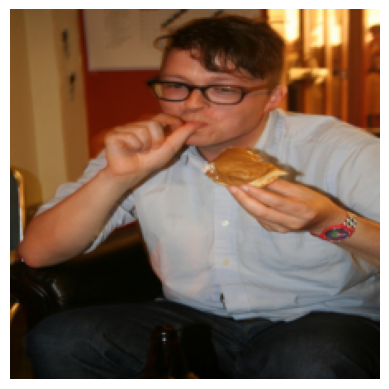

Question: [CLS] what sort of condiments does the man like? [SEP]
Prediction: [UNK]
Ground Truth Label: [UNK]


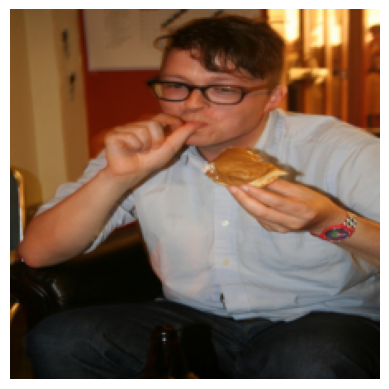

Question: [CLS] does this gentleman need to shave? [SEP]
Prediction: no
Ground Truth Label: no


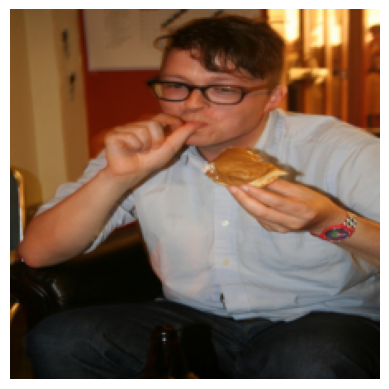

Question: [CLS] wristwatch, bracelet or fitness tracker? [SEP]
Prediction: pie
Ground Truth Label: [UNK]


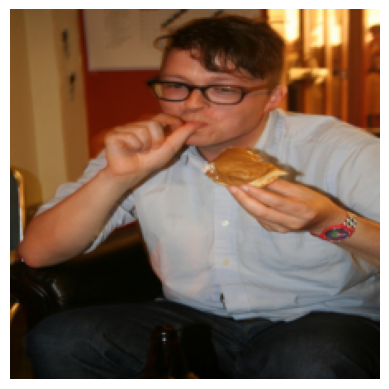

Question: [CLS] what kind of food is this? [SEP]
Prediction: pie
Ground Truth Label: pie


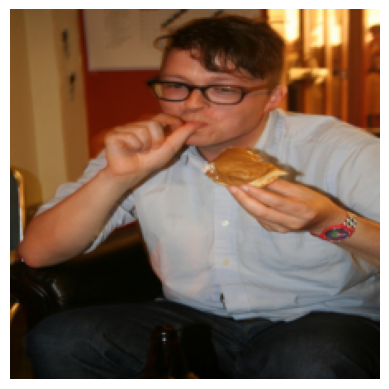

Question: [CLS] is this person wearing a ring? [SEP]
Prediction: no
Ground Truth Label: no


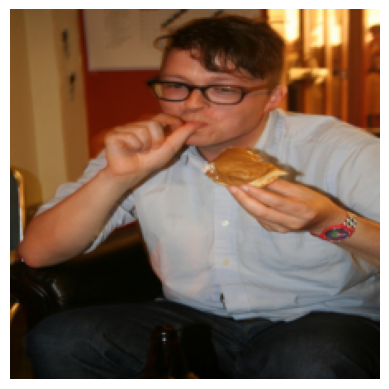

Question: [CLS] is this man bald? [SEP]
Prediction: no
Ground Truth Label: no


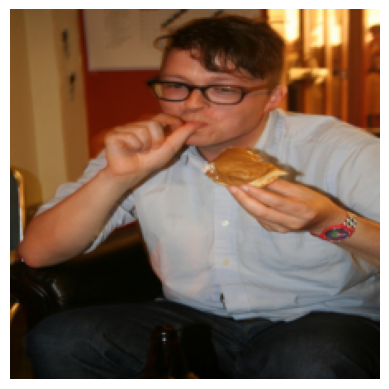

Question: [CLS] what is the boy holding? [SEP]
Prediction: food
Ground Truth Label: food


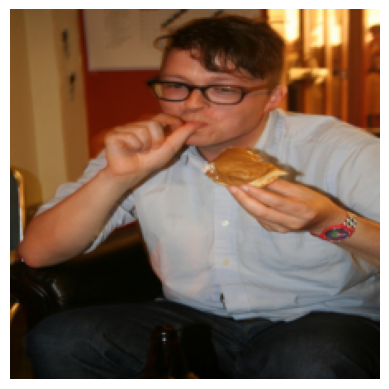

Question: [CLS] does this man need a haircut? [SEP]
Prediction: no
Ground Truth Label: no


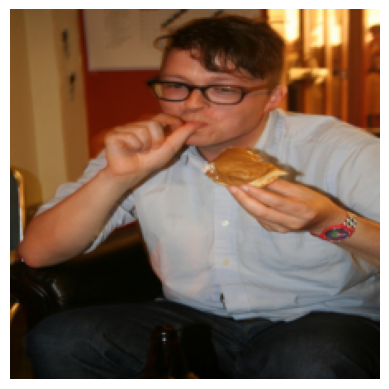

Question: [CLS] is the man pointing at the camera? [SEP]
Prediction: no
Ground Truth Label: no


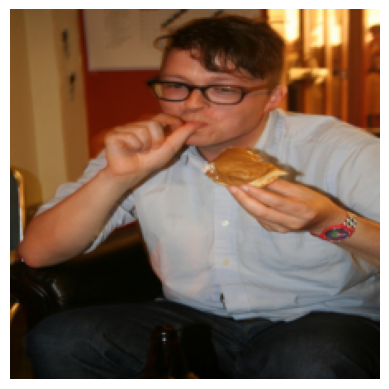

Question: [CLS] what is this man eating? [SEP]
Prediction: toast
Ground Truth Label: [UNK]


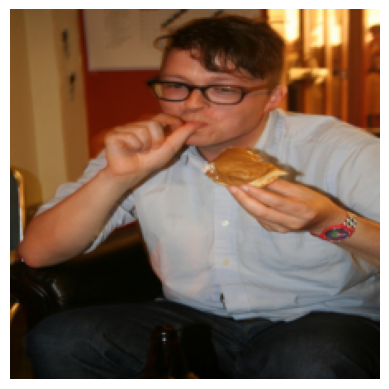

Question: [CLS] is the man smiling? [SEP]
Prediction: no
Ground Truth Label: no


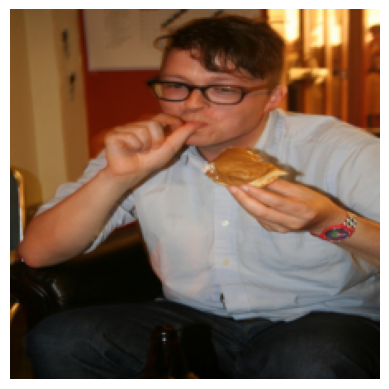

Question: [CLS] what this man eating? [SEP]
Prediction: toast
Ground Truth Label: toast


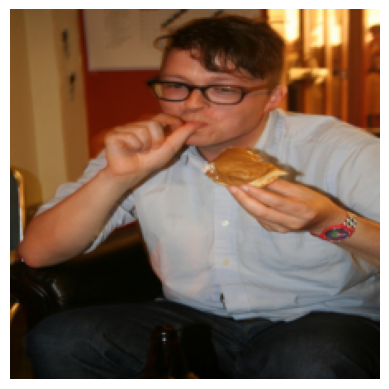

Question: [CLS] what is the man stuffing in his mouth? [SEP]
Prediction: food
Ground Truth Label: food


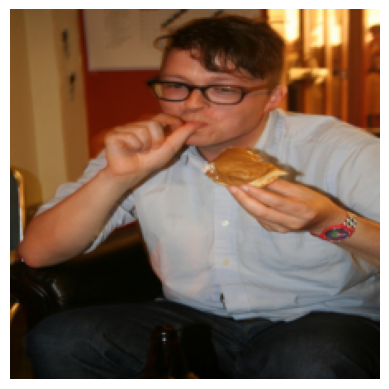

Question: [CLS] what color is the man's hat? [SEP]
Prediction: brown
Ground Truth Label: [UNK]


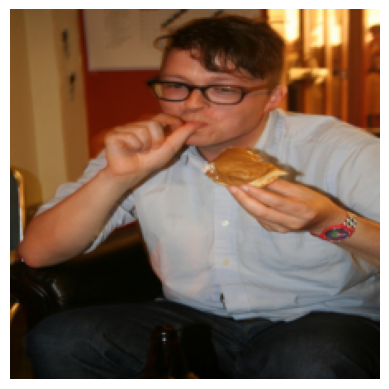

Question: [CLS] what is the woman eating with her hands? [SEP]
Prediction: pie
Ground Truth Label: pie


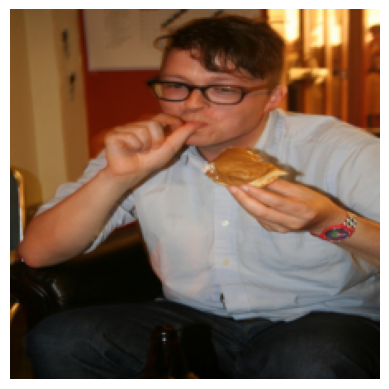

Question: [CLS] what is the man doing in this photo? [SEP]
Prediction: eating
Ground Truth Label: eating


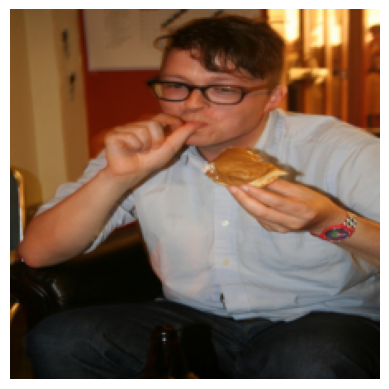

Question: [CLS] what is he sitting in? [SEP]
Prediction: chair
Ground Truth Label: chair


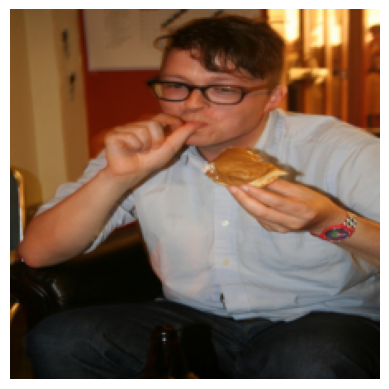

Question: [CLS] what is the man eating? [SEP]
Prediction: pie
Ground Truth Label: pie


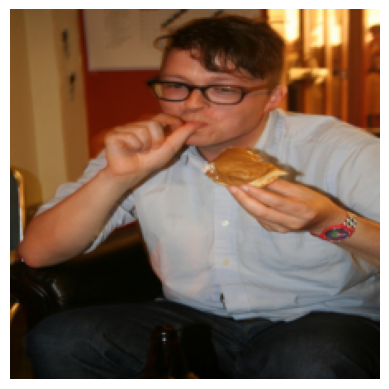

Question: [CLS] is the man wearing a ring? [SEP]
Prediction: no
Ground Truth Label: no


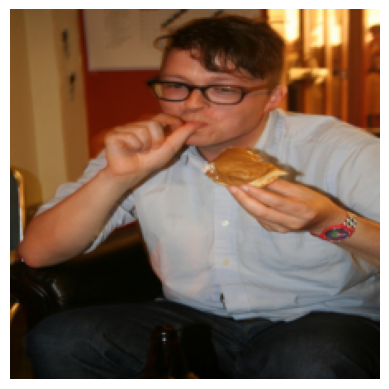

Question: [CLS] what kind of vegetable is on the sandwich? [SEP]
Prediction: none
Ground Truth Label: none


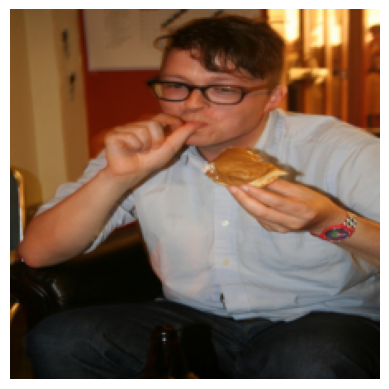

Question: [CLS] these kind of glasses frames are popular with what modern subculture? [SEP]
Prediction: [UNK]
Ground Truth Label: [UNK]


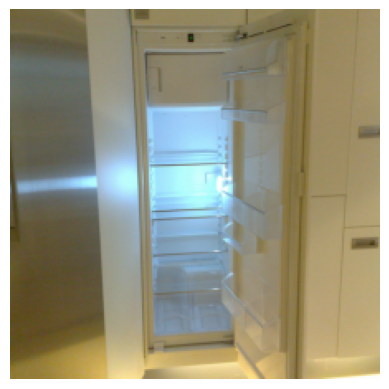

Question: [CLS] what is this room? [SEP]
Prediction: kitchen
Ground Truth Label: kitchen


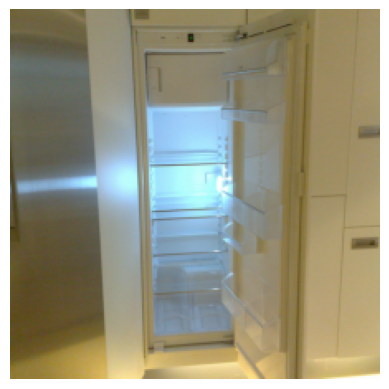

Question: [CLS] what color is the fridge? [SEP]
Prediction: silver
Ground Truth Label: white


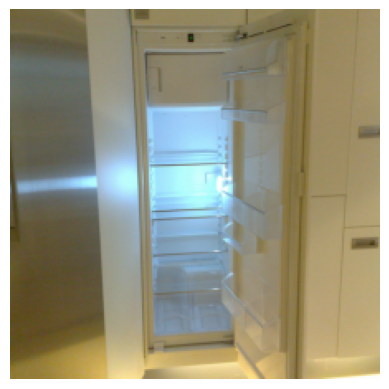

Question: [CLS] is there anything in the refrigerator? [SEP]
Prediction: no
Ground Truth Label: no


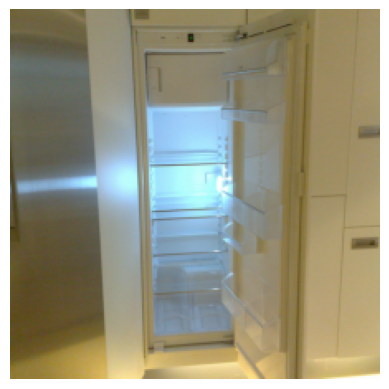

Question: [CLS] is this a new refrigerator? [SEP]
Prediction: yes
Ground Truth Label: yes


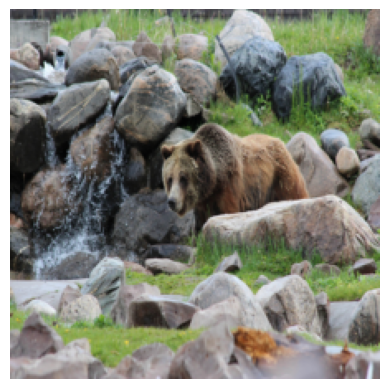

Question: [CLS] are the rocks wet? [SEP]
Prediction: no
Ground Truth Label: yes


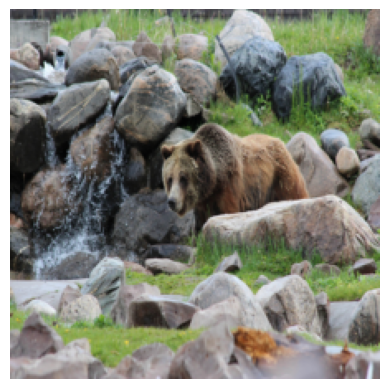

Question: [CLS] what color is the bear? [SEP]
Prediction: brown
Ground Truth Label: brown


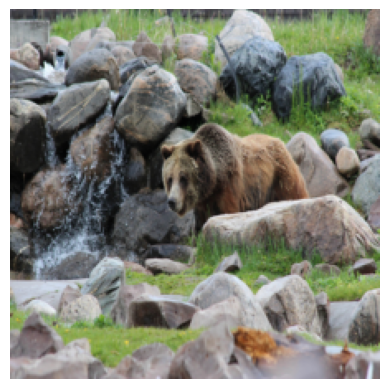

Question: [CLS] which way is the bear walking, to the left or to the right? [SEP]
Prediction: left
Ground Truth Label: left


In [5]:
import torch
import torch.nn as nn
from transformers import BertModel, ViTModel, BertTokenizer
from peft import LoraConfig, get_peft_model
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt

class VQAModel(nn.Module):
    def __init__(self, image_model, text_model, vocab_size):
        super(VQAModel, self).__init__()
        self.image_model = image_model
        self.text_model = text_model
        
        # LoRA configuration
        self.lora_config = LoraConfig(r=16, lora_alpha=32, lora_dropout=0.1, bias="none")
        
        # Apply LoRA to BERT and ViT models
        self.text_model = get_peft_model(
            self.text_model,
            self.lora_config
        )
        self.image_model = get_peft_model(
            self.image_model,
            self.lora_config
        )

        # Transformer decoder layer
        self.decoder_layer = nn.TransformerDecoderLayer(d_model=768, nhead=8)
        self.transformer_decoder = nn.TransformerDecoder(self.decoder_layer, num_layers=6)

        # Final classification layer
        self.fc = nn.Linear(768, vocab_size)

    def forward(self, image, input_ids, attention_mask):
        # Extract image features using ViT
        image_output = self.image_model(pixel_values=image).last_hidden_state  # Shape: [batch_size, seq_len, 768]
        image_cls_token = image_output[:, 0, :]  # Use [CLS] token representation for the image

        # Expand image features to match the batch size
        weighted_image_output = image_cls_token.unsqueeze(1)  # [batch_size, 1, 768]

        # Extract text features
        text_output = self.text_model(input_ids=input_ids, attention_mask=attention_mask).last_hidden_state

        # Prepare for transformer decoder
        image_features = weighted_image_output.permute(1, 0, 2)  # [1, batch_size, 768]
        text_features = text_output.permute(1, 0, 2)  # [seq_len, batch_size, 768]

        # Transformer decoder forward pass
        decoder_output = self.transformer_decoder(tgt=text_features, memory=image_features)

        # Classification
        combined_output = decoder_output.permute(1, 0, 2)  # [batch_size, seq_len, 768]
        logits = self.fc(combined_output[:, -1, :])  # Use the last token's representation for classification

        return logits

    
    
    
def decode_predictions(output, tokenizer):
    probabilities = torch.softmax(output, dim=-1)
    predicted_index = torch.argmax(probabilities, dim=-1).item()
    tokens = tokenizer.convert_ids_to_tokens(predicted_index)
    prediction = "".join(tokens)
    return prediction

def compute_accuracy(predictions, label):
    correct = 1 if predictions == label else 0
    return correct


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

image_model = ViTModel.from_pretrained('google/vit-base-patch16-224-in21k')
text_model = BertModel.from_pretrained('bert-base-uncased')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
vocab_size = tokenizer.vocab_size
# Load the model
model = VQAModel(image_model, text_model, vocab_size).to(device)
model.load_state_dict(torch.load("/kaggle/input/vqa-model/vqa_model.pth", map_location=torch.device('cpu')))
model.eval()

# Load the tokenizer



# Iterate through the test dataset
with torch.no_grad():
    for batch in test_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        image = batch["image"].to(device)
        labels = batch["label"]

        # Forward pass
        outputs = model(image, input_ids, attention_mask)

        # Decode prediction and ground truth label
        prediction = decode_predictions(outputs, tokenizer)
        label = tokenizer.convert_ids_to_tokens(labels.item())

        # Compute accuracy
        accuracy = compute_accuracy(prediction, label)

        # Show the image
        show_image(image.squeeze())
        question = tokenizer.decode(input_ids.squeeze().tolist())
        print("Question:",question)
        # Print prediction, label, and accuracy
        print("Prediction:", prediction)
        print("Ground Truth Label:", label)
#         print("Accuracy:", accuracy)


